In [ ]:
# install the necessary libraries
!pip install datapane
!pip install numerize
!pip install geopandas
!pip install folium matplotlib mapclassify
!pip install plotly --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.3 MB 21.8 MB/s 
  Attempting uninstall: plotly
    Found existing installation: plotly 5.5.0
    Uninstalling plotly-5.5.0:
      Successfully uninstalled plotly-5.5.0


In [1]:
# add the the value of the token to connect to datapane cloud
!datapane login --token=e1324c55252260c8764fca4091f9bb05da32e616

Connected successfully to https://cloud.datapane.com as oulebsir.rafik.free@gmail.com


C:\Users\rafik\Anaconda3\envs\Geo_DA_env\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.8) or chardet (5.0.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


In [43]:
# import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import plotly.express as px
import plotly.graph_objects as go
import geopandas as gpd

import datapane as dp
from numerize import numerize

# set the style of the different plots
sns.set_style("darkgrid")

In [3]:
# import the earnings data
gains = pd.read_csv("gains.csv")
gains.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249613 entries, 0 to 249612
Data columns (total 13 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   date                  249613 non-null  object 
 1   pulocationid          249613 non-null  int64  
 2   hvfhs_license_num     249613 non-null  object 
 3   base_passenger_fare   249613 non-null  float64
 4   tolls                 249613 non-null  float64
 5   bcf                   249613 non-null  float64
 6   sales_tax             249613 non-null  float64
 7   congestion_surcharge  249613 non-null  float64
 8   airport_fee           249613 non-null  float64
 9   tips                  249613 non-null  float64
 10  driver_pay            249613 non-null  float64
 11  year                  249613 non-null  int64  
 12  month                 249613 non-null  int64  
dtypes: float64(8), int64(3), object(2)
memory usage: 24.8+ MB


In [6]:
# select january data
gains_jan = gains[gains["month"] == 1]
gains_jan.drop(["year", "month"], axis=1, inplace = True)
# initialize some essential values 
com_name = {"HV0003": "Uber",
            "HV0004": "Via",
            "HV0005": "Lyft"}

C:\Users\rafik\AppData\Local\Temp\ipykernel_8948\2056814071.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gains_jan.drop(["year", "month"], axis=1, inplace = True)


In [7]:
gains_jan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22954 entries, 93786 to 243792
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  22954 non-null  object 
 1   pulocationid          22954 non-null  int64  
 2   hvfhs_license_num     22954 non-null  object 
 3   base_passenger_fare   22954 non-null  float64
 4   tolls                 22954 non-null  float64
 5   bcf                   22954 non-null  float64
 6   sales_tax             22954 non-null  float64
 7   congestion_surcharge  22954 non-null  float64
 8   airport_fee           22954 non-null  float64
 9   tips                  22954 non-null  float64
 10  driver_pay            22954 non-null  float64
dtypes: float64(8), int64(1), object(2)
memory usage: 2.1+ MB


# Big numbers

In [8]:
# total pay of all companies and all zones

# create a dict to add values of the big numbers
total_pay_sum = dict()

# append the values of each company
for key in com_name.keys():
  total_pay_sum[com_name[key]] = gains_jan[gains_jan["hvfhs_license_num"] == key]["driver_pay"].sum()

In [198]:
# create the big number in datapane
com_head = [key for key in total_pay_sum.keys()]
bigN = dp.Group(
        dp.BigNumber(
            heading= com_head[0] + " total driver pay",
            value= numerize.numerize(total_pay_sum[com_head[0]]) + " $",
        ),
         dp.BigNumber(
            heading= com_head[1] + " total driver pay",
            value= numerize.numerize(total_pay_sum[com_head[1]]) + " $",
        ),
         dp.BigNumber(
            heading= com_head[2] + " total driver pay",
            value= numerize.numerize(total_pay_sum[com_head[2]]) + " $",
        ),
        columns=3,
    )

#app = dp.App(bigN)

#app.upload(name="My example report")

# Daily average of a company

In [11]:
# select the company 
company = "HV0005" # Uber

In [12]:
# filter dataframe with the company name
comp_gains = gains_jan[gains_jan["hvfhs_license_num"] == company]

## Barplot of earnings parameters

In [13]:
# sum of some parameter
daily_avg_comp = comp_gains.mean().drop(["pulocationid"])

C:\Users\rafik\AppData\Local\Temp\ipykernel_8948\3876256821.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  daily_avg_comp = comp_gains.mean().drop(["pulocationid"])


### Altair plot

In [15]:
# transform the series to dataframe using to_frame()
daily_avg_df = daily_avg_comp.to_frame().reset_index()

# Rename the columns
daily_avg_df.columns = ["parameter", "daily_average"]

# create the altair plot 
daily_avg_plt = alt.Chart(daily_avg_df).mark_bar().encode(
    x='parameter',
    y='daily_average',
    tooltip = ["daily_average"]
).properties(
    width=500,
    height=250
).configure_axis(
    labelFontSize=14,
    titleFontSize=14
).interactive()


alt.Chart(...)

### Plotly chart

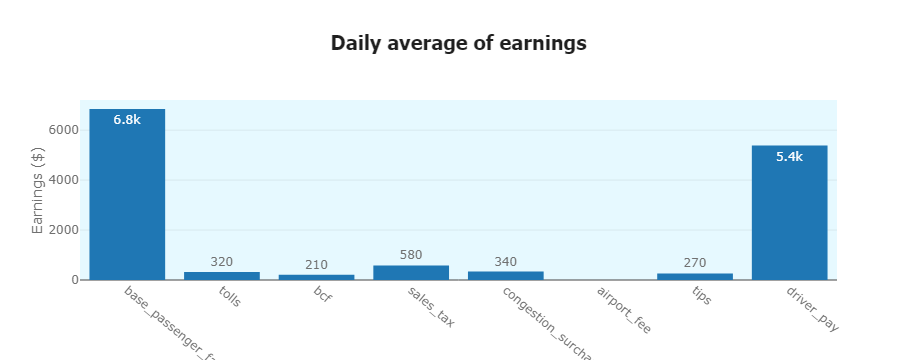

In [90]:
# transform the series to dataframe using to_frame()
daily_avg_df = daily_avg_comp.to_frame().reset_index()

# Rename the columns
daily_avg_df.columns = ["parameter", "daily_average"]

daily_avg_template = {
    "layout": go.Layout(
        font={
            "family": "Verdana",
            "size": 12,
            "color": "#707070",
        },
        title={
            "font": {
                "family": "Tahoma",
                "size": 20,
                "color": "#1f1f1f",
            }
        },
        plot_bgcolor="#e6f9ff"
    )
}

daily_avg_plt = px.bar(daily_avg_df, x='parameter', y='daily_average', 
                       text_auto='.2s',
                       title = "<b> Daily average of earnings </b>",
                       template=daily_avg_template)
daily_avg_plt.update_xaxes(tickangle=40, title=None)
daily_avg_plt.update_yaxes(title="Earnings ($)")
daily_avg_plt.update_traces(textfont_size=12, textangle=0)

In [ ]:
# app = dp.App(bigN, 
#              dp.Plot(daily_avg_plt))

# app.upload(name="My example report")

## Donut chart of revenue

In [21]:
# create dataframe to make the donut
donut_df = comp_gains.sum().drop(["date", "pulocationid", "hvfhs_license_num", "driver_pay"])
# calculate the total revenue for each columns
total_revenue = donut_df.sum()
donut_df = donut_df * (100/total_revenue)
# round the values
donut_df = donut_df.apply(lambda x: round(x,2))
# transform the series to dataframe
donut_df = donut_df.to_frame().reset_index()
# rename the columns
donut_df.columns = ["parameter", "percentage of monthly total revenue"]

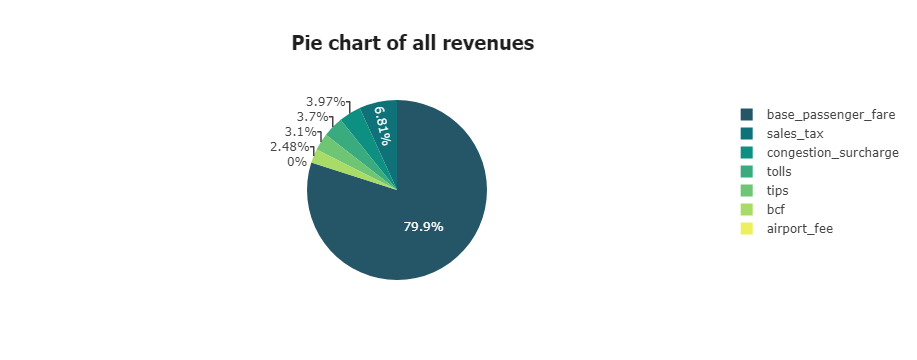

In [105]:
donut_template = {
    "layout": go.Layout(
        title={
            "font": {
                "family": "Tahoma",
                "size": 20,
                "color": "#1f1f1f"
            },
            'y':0.9, # new
            'x':0.45,
            'xanchor': 'center',
            'yanchor': 'top'  
        }
    )
}

# create the donut plot using plotly
donut_plot = px.pie(donut_df, 
             values='percentage of monthly total revenue', 
             names='parameter',
             title= "<b> Pie chart of all revenues </b>",      
             color_discrete_sequence=px.colors.sequential.Aggrnyl,
             template=donut_template)
donut_plot.show()

In [ ]:
# app = dp.App(bigN, 
#              dp.Group(
#                  dp.Plot(daily_avg_plt),
#                  dp.Plot(donut_plot),
#                  columns = 2)
# )

# app.upload(name="My example report")

## Best revenue classement

In [200]:
# Set filepath
shp_path = "./data/taxi_zones.shp"

# Read file using gpd.read_file()
nyc_gjson = gpd.read_file(shp_path)
# drop some columns
nyc_gjson.drop(["OBJECTID", "Shape_Leng", "Shape_Area"], axis=1, inplace = True)

In [201]:
nyc_gjson

,zone,LocationID,borough,geometry
0,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19..."
1,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343..."
2,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.770 256767.698, 1026495.593 ..."
3,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20..."
4,Arden Heights,5,Staten Island,"POLYGON ((935843.310 144283.336, 936046.565 14..."
...,...,...,...,...
258,Woodlawn/Wakefield,259,Bronx,"POLYGON ((1025414.782 270986.139, 1025138.624 ..."
259,Woodside,260,Queens,"POLYGON ((1011466.966 216463.005, 1011545.889 ..."
260,World Trade Center,261,Manhattan,"POLYGON ((980555.204 196138.486, 980570.792 19..."
261,Yorkville East,262,Manhattan,"MULTIPOLYGON (((999804.795 224498.527, 999824...."


In [26]:
# create the full name of the zone
nyc_gjson["zone_full_name"] = nyc_gjson["borough"] + " - " + nyc_gjson["zone"]
nyc_gjson.head()

,zone,LocationID,borough,geometry,zone_full_name
0,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19...",EWR - Newark Airport
1,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343...",Queens - Jamaica Bay
2,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.770 256767.698, 1026495.593 ...",Bronx - Allerton/Pelham Gardens
3,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20...",Manhattan - Alphabet City
4,Arden Heights,5,Staten Island,"POLYGON ((935843.310 144283.336, 936046.565 14...",Staten Island - Arden Heights


In [27]:
nyc_gjson["pulocationid"] = nyc_gjson["LocationID"]
nyc_gjson.drop(["LocationID", "zone", "borough"], axis=1, inplace=True)

In [28]:
nyc_gjson.head()

,geometry,zone_full_name,pulocationid
0,"POLYGON ((933100.918 192536.086, 933091.011 19...",EWR - Newark Airport,1
1,"MULTIPOLYGON (((1033269.244 172126.008, 103343...",Queens - Jamaica Bay,2
2,"POLYGON ((1026308.770 256767.698, 1026495.593 ...",Bronx - Allerton/Pelham Gardens,3
3,"POLYGON ((992073.467 203714.076, 992068.667 20...",Manhattan - Alphabet City,4
4,"POLYGON ((935843.310 144283.336, 936046.565 14...",Staten Island - Arden Heights,5


In [29]:
# create dataframe of all driver pay
zone_gains = comp_gains[["pulocationid", "driver_pay"]]
zone_gains = zone_gains.groupby(["pulocationid"]).sum()
zone_gains = zone_gains.reset_index()

# merge the zone_gains dataframe with nyc_gjson dataframe
zone_gains = pd.merge(zone_gains, nyc_gjson, on=["pulocationid"])
zone_gains.head()

,pulocationid,driver_pay,geometry,zone_full_name
0,1,238.47,"POLYGON ((933100.918 192536.086, 933091.011 19...",EWR - Newark Airport
1,2,145.70,"MULTIPOLYGON (((1033269.244 172126.008, 103343...",Queens - Jamaica Bay
2,3,99801.52,"POLYGON ((1026308.770 256767.698, 1026495.593 ...",Bronx - Allerton/Pelham Gardens
3,4,163102.14,"POLYGON ((992073.467 203714.076, 992068.667 20...",Manhattan - Alphabet City
4,5,11075.82,"POLYGON ((935843.310 144283.336, 936046.565 14...",Staten Island - Arden Heights


In [30]:
# get the data that we needs
zone_bar_df = zone_gains[["pulocationid", "driver_pay", "zone_full_name"]].copy()
# sort the values
zone_bar_df.sort_values("driver_pay", ascending=False, inplace=True)

# get the top 10 locations
zone_bar_df = zone_bar_df.iloc[:10,:]
zone_bar_df

,pulocationid,driver_pay,zone_full_name
128,132,948092.48,Queens - JFK Airport
60,61,829120.97,Brooklyn - Crown Heights North
75,76,629875.33,Brooklyn - East New York
134,138,622831.75,Queens - LaGuardia Airport
36,37,615315.28,Brooklyn - Bushwick South
41,42,567186.52,Manhattan - Central Harlem North
220,225,517942.84,Brooklyn - Stuyvesant Heights
16,17,492244.72,Brooklyn - Bedford
88,89,456589.47,Brooklyn - Flatbush/Ditmas Park
239,244,451941.17,Manhattan - Washington Heights South


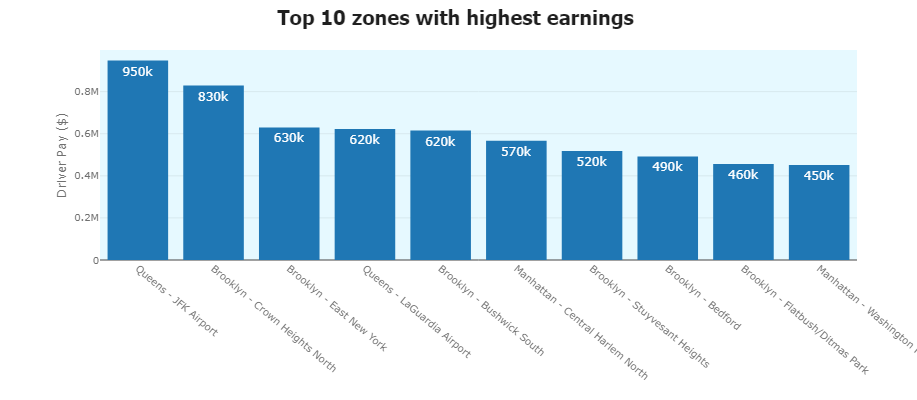

In [158]:
top10_template = {
    "layout": go.Layout(
        font={
            "family": "Verdana",
            "size": 10,
            "color": "#707070",
        },
        title={
            "font": {
                "family": "Tahoma",
                "size": 20,
                "color": "#1f1f1f",
            }
        },
        plot_bgcolor="#e6f9ff"
    )
}

zone_bar_plot = px.bar(zone_bar_df, x='zone_full_name', y='driver_pay', 
                       text_auto='.2s', 
                       title = "<b>Top 10 zones with highest earnings </b>",
                       width=900, height=400,
                       template=top10_template)
zone_bar_plot.update_xaxes(tickangle=40, title=None)

zone_bar_plot.update_yaxes(title="Driver Pay ($)")
zone_bar_plot.update_traces(textfont_size=12, textangle=0)
zone_bar_plot.update_layout(margin={"r": 60, "t": 50, "l": 100, "b": 140})

In [ ]:
app = dp.App(dp.Text("<center> <h1> January Taxi report </h1> </center>"),
              bigN, 
             dp.Group(
                 dp.Text("## Daily average revenue"),
                 dp.Text("## Monthly revenue percentage"),
                 dp.Plot(daily_avg_plt),
                 dp.Plot(donut_plot),
                 columns = 2),
             dp.Text("## Revenue by zone"),
             dp.Plot(zone_bar_plot)
)

#app.upload(name="My example report")
app.save("First Report Jan.html")

App saved to ./First Report Jan.html


# Map of earnings

In [32]:
# convert the dataframe to geodataframe
zone_gains_gdf = gpd.GeoDataFrame(zone_gains, geometry="geometry")

# change the projection system
zone_gains_gdf = zone_gains_gdf.to_crs("WGS84")

<AxesSubplot:>

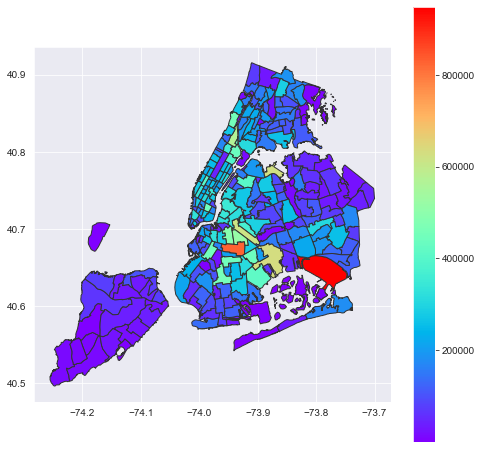

In [33]:
zone_gains_gdf.plot(figsize=(8, 8), column="driver_pay", legend=True,
              edgecolor="0.2", markersize=200, cmap="rainbow")

In [34]:
nyc_map = zone_gains_gdf.explore("driver_pay")
#nyc_map

In [ ]:
zone_gains_gdf

,pulocationid,driver_pay,geometry,zone_full_name
0,1,238.47,"POLYGON ((-74.18445 40.69500, -74.18449 40.695...",EWR - Newark Airport
1,2,145.70,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...",Queens - Jamaica Bay
2,3,99801.52,"POLYGON ((-73.84793 40.87134, -73.84725 40.870...",Bronx - Allerton/Pelham Gardens
3,4,163102.14,"POLYGON ((-73.97177 40.72582, -73.97179 40.725...",Manhattan - Alphabet City
4,5,11075.82,"POLYGON ((-74.17422 40.56257, -74.17349 40.562...",Staten Island - Arden Heights
...,...,...,...,...
254,259,187632.56,"POLYGON ((-73.85107 40.91037, -73.85207 40.909...",Bronx - Woodlawn/Wakefield
255,260,147543.08,"POLYGON ((-73.90175 40.76078, -73.90147 40.759...",Queens - Woodside
256,261,151575.46,"POLYGON ((-74.01333 40.70503, -74.01327 40.704...",Manhattan - World Trade Center
257,262,185749.15,"MULTIPOLYGON (((-73.94383 40.78286, -73.94376 ...",Manhattan - Yorkville East


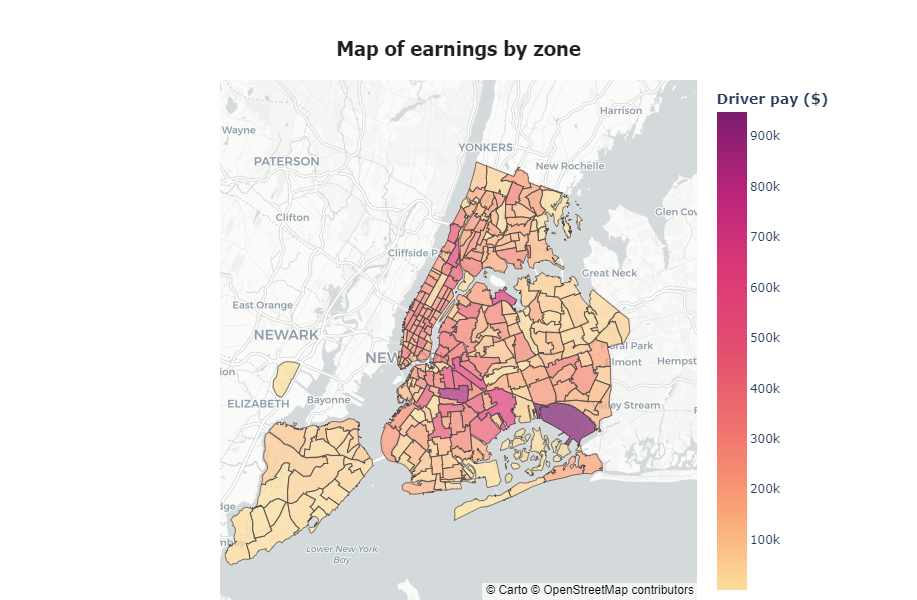

error uploading: HTTPSConnectionPool(host='events.datapane.com', port=443): Max retries exceeded with url: /batch/ (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x000002374DB16760>: Failed to establish a new connection: [Errno 11001] getaddrinfo failed'))


In [194]:
# creating a map using plotly
zone_map = px.choropleth_mapbox(zone_gains_gdf,
                           geojson=zone_gains_gdf["geometry"],
                           locations=zone_gains_gdf.index,
                           color="driver_pay",
                           center={"lat": 40.730610, "lon": -73.935242},
                           mapbox_style="carto-positron",
                           color_continuous_scale = px.colors.sequential.Sunsetdark,
                           opacity=0.7,
                           hover_data=["zone_full_name", "driver_pay"],
                           title = "<b> Map of earnings by zone </b>",  
                           width=400, height=600,
                           zoom=9)
zone_map.update_layout(margin={"r": 220, "t": 80, "l": 220, "b": 0})
zone_map.update_layout(
    title={
            "font": {
                "family": "Tahoma",
                "size": 20,
                "color": "#1f1f1f"
            },
            'y':0.93, # new
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'
        })
zone_map.update_layout(
    coloraxis_colorbar = {
            "title" : "<b>Driver pay ($)</b>"
        })

In [199]:
app = dp.App(dp.Text("<center><h1>🚕 January Taxi report </h1></center>"),
             
              bigN,
             dp.Plot(zone_map),
             dp.Group(
                 dp.Plot(daily_avg_plt),
                 dp.Plot(donut_plot),
                 columns = 2),
             dp.Plot(zone_bar_plot)
)

#app.upload(name="My example report")
app.save("First Report Jan.html")

App saved to ./First Report Jan.html

In [174]:
help(dp.Plot)

Help on class Plot in module datapane.client.api.report.blocks:

class Plot(AssetBlock)
 |  Plot(data: Any, caption: Union[str, NoneType] = None, responsive: bool = True, scale: float = 1.0, name: str = None, label: str = None)
 |  
 |  Plot blocks store a Python-based plot object, including ones created by Altair, Plotly, Matplotlib, Bokeh, Folium, and PlotAPI,
 |  for interactive display in your report when viewed in the browser.
 |  
 |  Method resolution order:
 |      Plot
 |      AssetBlock
 |      DataBlock
 |      BaseElement
 |      abc.ABC
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, data: Any, caption: Union[str, NoneType] = None, responsive: bool = True, scale: float = 1.0, name: str = None, label: str = None)
 |      Args:
 |          data: The `plot` object to attach
 |          caption: A caption to display below the plot (optional)
 |          responsive: Whether the plot should automatically be resized to fit, set to False if your plot